In [214]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import (
    vit_b_16, ViT_B_16_Weights,
    resnet50, ResNet50_Weights
    )

############################################################################################################
'''
BackBones
- Vision Transformer (ViT)
- ResNet50
'''

class ResNetBackbone(nn.Module):
    def __init__(self, pretrained = True):
        super().__init__()
        # Load ResNet50 with pre-trained weights
        if pretrained:
            self.backbone = resnet50(weights=ResNet50_Weights.DEFAULT)
        else:
            self.backbone = resnet50(weights=None)
        self.backbone.fc = nn.Identity()  # Remove the classification head

    def forward(self, x):
        # Forward pass through ResNet50 backbone
        return self.backbone(x)

    
class ViTBackbone(nn.Module):
    def __init__(self, pretrained = True):
        """
        Args:
            weights: Pre-trained weights to use for the ViT model. Use `None` for no pre-training.
        """
        super().__init__()
        # Load the Vision Transformer with pretrained weights
        if pretrained:
            self.backbone = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)
        else:
            self.backbone = vit_b_16(weights=None)
        self.backbone.heads = nn.Identity()  # Remove the classification head

    def forward(self, x):
        # Forward pass through the ViT backbone
        x = self.backbone(x)
        return x
    
############## Multimodal Encoder-Decoder Network ##########################
class IngredientFeatureExtractor(nn.Module):
    def __init__(self, embedding_dim, hidden_dim, lstm_layers):
        super(IngredientFeatureExtractor, self).__init__()
        # 300-dimensional GloVe embeddings for ingredients
        # 768-dimensional BERT embeddings for ingredients
        self.lstm = nn.LSTM(input_size=embedding_dim, hidden_size=hidden_dim, num_layers=lstm_layers, batch_first=True)

    def forward(self, ingredient_embeddings):
        # ingredient_embeddings: (num_ingr, embedding_dim) as each image will have the same candidate ingredients
        # Pass through LSTM
        lstm_out, _ = self.lstm(ingredient_embeddings)  # Output: (batch, 1, hidden_dim)
        
        # Extract the output from the LSTM
        ingr_feature = lstm_out[:, -1, :]  # Output: (batch, hidden_dim)
        
        return ingr_feature
    
class ImageFeatureExtractor(nn.Module):
    def __init__(self, backbone='resnet', pretrained=True, hidden_dim=256):
        super(ImageFeatureExtractor, self).__init__()
        
        # Use the specified backbone
        self.backbone_type = backbone
        if backbone == "vit":
            self.backbone = ViTBackbone(pretrained)
            input_size = 768
        elif backbone == "resnet":
            self.backbone = ResNetBackbone(pretrained)
            input_size = 2048
        else:
            raise ValueError(f"Invalid backbone {backbone}")

        self.image_fc = nn.Linear(input_size, hidden_dim)

    def forward(self, images):
        # images: (batch_size, 3, 224, 224)
        image_features = self.backbone(images) # (batch_size, 768)
        image_features = self.image_fc(image_features) # (batch_size, hidden_dim)
        return image_features

class AttentionEncoderDecoder(nn.Module):
    def __init__(self, num_heads, d_model, dropout=0.3, epsilon=1e-6):
        super(AttentionEncoderDecoder, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        self.dropout = dropout
        self.epsilon = epsilon

        # Encoder layers (for ingredient features)
        # self-attention
        self.ingredients_sa = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, dropout=dropout)
        self.ingredients_sa_normalized = nn.LayerNorm(d_model, eps=epsilon)
        self.ingredients_aligned = nn.Linear(d_model, d_model)
        self.ingredients_encoded = nn.LayerNorm(d_model, eps=epsilon)

        # Decoder layers (for dish image features)
        # guided attention + self-attention
        self.dish_image_ga = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, dropout=dropout)
        self.dish_image_ga_normalized = nn.LayerNorm(d_model, eps=epsilon)
        
        # self-attention to model spatial relationships among dish image regions
        self.dish_image_sa = nn.MultiheadAttention(embed_dim=d_model, num_heads=num_heads, dropout=dropout)
        self.dish_image_sa_normalized = nn.LayerNorm(d_model, eps=epsilon)
        self.dish_image_aligned = nn.Linear(d_model, d_model)
        self.dish_image_decoded = nn.LayerNorm(d_model, eps=epsilon)

    def forward(self, ingredients, dish_image):
        # Encoder: Ingredients Self-Attention
        ingredients_sa, _ = self.ingredients_sa(ingredients, ingredients, ingredients) # (batch_size, d_model)
        ingredients_sa = self.ingredients_sa_normalized(ingredients_sa + ingredients) # (batch_size, d_model)
        ingredients_aligned = F.relu(self.ingredients_aligned(ingredients_sa)) # (batch_size, dff)
        ingredients_encoded = self.ingredients_encoded(ingredients_sa + ingredients_aligned) # (batch_size, d_model)

        # Decoder: Dish Image Guided Attention + Self-Attention
        dish_image_ga, _ = self.dish_image_ga(dish_image, ingredients_encoded, ingredients_encoded)
        dish_image_ga = self.dish_image_ga_normalized(dish_image_ga + dish_image)
        dish_image_sa, _ = self.dish_image_sa(dish_image_ga, dish_image_ga, dish_image_ga)
        dish_image_sa = self.dish_image_sa_normalized(dish_image_sa + dish_image_ga)
        dish_image_aligned = F.relu(self.dish_image_aligned(dish_image_sa))
        dish_image_decoded = self.dish_image_decoded(dish_image_sa + dish_image_aligned)

        return ingredients_encoded, dish_image_decoded
    
class MultimodalPredictionNetwork(nn.Module):
    def __init__(self, num_ingr = 199, backbone = "vit", ingredient_embedding = None, pretrained = True, hidden_dim = 512, lstm_layers = 1, num_heads = 8, dropout = 0.3, epsilon = 1e-6):
        super(MultimodalPredictionNetwork, self).__init__()
        
        self.ingredient_embedding = ingredient_embedding
        
        self.ingredient_extractor = IngredientFeatureExtractor(embedding_dim=ingredient_embedding.size(1), hidden_dim=hidden_dim, lstm_layers=lstm_layers)
        self.image_extractor = ImageFeatureExtractor(backbone=backbone, pretrained = pretrained, hidden_dim=hidden_dim)
        
        # Attention Encoder-Decoder
        self.attn_enc_dec = AttentionEncoderDecoder(num_heads, hidden_dim, dropout, epsilon)
        self.fusion_layer = nn.Linear(hidden_dim * 2, hidden_dim)
        
        # Mass prediction
        self.mlp = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(),
            nn.Linear(hidden_dim // 2, num_ingr),
        )

    def forward(self, images):
        # Extract features
        ingredient_embeddings = self.ingredient_embedding.unsqueeze(0).repeat(images.size(0), 1, 1)
        ingredients_features = self.ingredient_extractor(ingredient_embeddings)
        dish_image_features = self.image_extractor(images)
        
        # Attention Encoder-Decoder
        ingredients_encoded, dish_image_decoded = self.attn_enc_dec(ingredients_features, dish_image_features)

        # Global pooling
        # Multimodal fusion
        fused_features = torch.cat([ingredients_encoded, dish_image_decoded], dim=1) # (batch_size, d_model * 2)
        fused_features = self.fusion_layer(fused_features) # (batch_size, d_model)

        # Mass prediction
        prediction = self.mlp(fused_features) # (batch_size, num_ingr)
        return prediction
    
class DishAttentionAttributionWrapper(nn.Module):
    def __init__(self, model):
        super(DishAttentionAttributionWrapper, self).__init__()
        self.model = model
        
    def forward(self, images):
        # Extract features
        ingredient_embeddings = self.model.ingredient_embedding.unsqueeze(0).repeat(images.size(0), 1, 1)
        ingredients_features = self.model.ingredient_extractor(ingredient_embeddings)
        dish_image_features = self.model.image_extractor(images)
        
        # Get the attention outputs
        dish_image_decoded = self.model.attn_enc_dec(ingredients_features, dish_image_features)[1]

        # Return only the specified output
        return dish_image_decoded.sum(dim=-1)

class IngrAttentionAttributionWrapper(nn.Module):
    def __init__(self, model):
        super(IngrAttentionAttributionWrapper, self).__init__()
        self.model = model
        self.image = None
        
    def forward(self, ingredient_embeddings):
        # Extract features
        ingredient_embeddings = ingredient_embeddings.unsqueeze(0).repeat(self.image.size(0), 1, 1)
        ingredients_features = self.model.ingredient_extractor(ingredient_embeddings)
        dish_image_features = self.model.image_extractor(self.image)
        
        # Get the attention outputs
        ingredients_encoded = self.model.attn_enc_dec(ingredients_features, dish_image_features)[0]

        # Return only the specified output
        return ingredients_encoded.sum(dim=-1)

############################################################################################################
num_ingr = 199
x = torch.randn(16, 3, 224, 224) # For ConvLSTM model and ViT model
print("\nTesting the Multimoal Encoder-Decoder Network")
embed = torch.randn(num_ingr, 768) # Assume 768-dimensional embeddings
multimodal_model = MultimodalPredictionNetwork(num_ingr, "resnet", embed, hidden_dim=512)
output = multimodal_model(x)
print(f"Output shape: {output.shape}")
print(f'Test Passed: {output.shape == torch.Size([x.size(0), num_ingr])}')

print("\nTesting the Attention Attribution Wrapper")
model = DishAttentionAttributionWrapper(multimodal_model)
output = model(x)
print(f"Output shapes: {output.shape}")

model = IngrAttentionAttributionWrapper(multimodal_model)
model.image = x
output = model(embed)
print(f"Output shapes: {output.shape}")


Testing the Multimoal Encoder-Decoder Network
Output shape: torch.Size([16, 199])
Test Passed: True

Testing the Attention Attribution Wrapper
Output shapes: torch.Size([16])
Output shapes: torch.Size([16])


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load the model
model_backbone = "resnet"
embed_path = "bert"
model_path = f"multimodal_{model_backbone}_{embed_path}_pretrained_da_16_75_25"

embeddings = torch.load(f'../utils/embeddings/ingredient_embeddings_{embed_path}.pt', map_location=device, weights_only=True)

resnet_model = MultimodalPredictionNetwork(num_ingr, model_backbone, embeddings, hidden_dim=512).to(device)
resnet_model.load_state_dict(torch.load(f'./checkpoints/{model_path}.pth', map_location=device, weights_only=True))
resnet_model.eval()

model_backbone = "vit"
embed_path = "bert"
model_path = f"multimodal_{model_backbone}_{embed_path}_pretrained_da_16_75_25"

vit_model = MultimodalPredictionNetwork(num_ingr, model_backbone, embeddings, hidden_dim=512).to(device)
vit_model.load_state_dict(torch.load(f'./checkpoints/{model_path}.pth', map_location=device, weights_only=True))
vit_model.eval()

resnet_dish_wrapped_model = DishAttentionAttributionWrapper(resnet_model)
vit_dish_wrapped_model = DishAttentionAttributionWrapper(vit_model)

In [216]:
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
import os
import random
import pandas as pd
from PIL import Image
import numpy as np

### Data Paths ###
dataset_path = '../../data/nutrition5k_reconstructed/'

image_path = os.path.join(dataset_path, 'images')
ingr_mata = os.path.join(dataset_path, 'metadata/ingredients_metadata.csv')

# Load the ingredient metadata
ingr_dataset_path = '../utils/data/train_labels_ingr_log.csv'
val_dataset_path = '../utils/data/val_labels_ingr_log.csv'
test_dataset_path = '../utils/data/test_labels_ingr_log.csv'
ingr_meta_df = pd.read_csv(ingr_mata)

ingr_df = pd.read_csv(ingr_dataset_path)
val_df = pd.read_csv(val_dataset_path)
test_df = pd.read_csv(test_dataset_path)

ingr_df = pd.concat([ingr_df, val_df, test_df], ignore_index=True)
test_image_ids = ingr_df['id'].tolist()

# randomly sample 8 images
random.seed(42)
sampled_images = random.sample(test_image_ids, 8)

# sampled_images = ['dish_1564518512']

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

transform_normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

all_ingredients = ingr_df.columns[1:-1].tolist()

transformed_images = []
input_images = []
ingr_index = []
highest_ingr_indices = []
highest_ingr_name = []
highest_ingr_value = []

for image_id in sampled_images:
    # Prepare input image (e.g., a single image from a dataset)
    image_to_explain = f"../../data/nutrition5k_reconstructed/images/{image_id}.jpeg"
    
    image = Image.open(image_to_explain).convert('RGB')
    # Apply the transformations needed
    transformed_image = transform(image)
    input_image = transform_normalize(transformed_image)
    
    transformed_images.append(transformed_image)
    input_images.append(input_image)
    
    # Get the row for the dish
    dish_row = ingr_df[ingr_df['id'] == image_id]
    # Get all indices with ingredients > 0 for the dish
    dish_row = dish_row.drop(columns=['id', 'img_indx'])
    
    # get all the indices of the ingredients where the value is greater than 0
    dish_ingr = dish_row.columns[(dish_row.iloc[0] > 0)].tolist()
    ingr_index.append([all_ingredients.index(ingr) for ingr in dish_ingr])


    # Find the ingredient with the highest value
    highest_ingr = dish_row.iloc[0].idxmax()    # Ingredient with the highest value
    highest_value = dish_row.iloc[0].max()    # Maximum value in the row
    highest_ingr_index = dish_row.columns.get_loc(highest_ingr)
    
    highest_ingr_indices.append(highest_ingr_index)
    highest_ingr_name.append(highest_ingr)
    highest_ingr_value.append(highest_value)
    

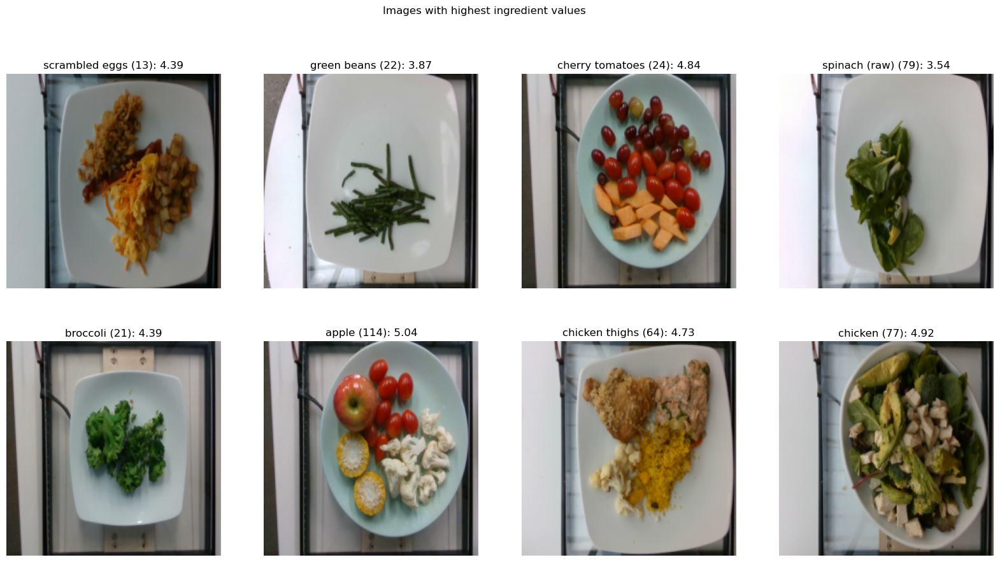

In [217]:
##### Visualize the images And Data #####
fig, axs = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Images with highest ingredient values')

for i, ax in enumerate(axs.flat):
    ax.imshow(transformed_images[i].permute(1, 2, 0))
    ax.set_title(f"{highest_ingr_name[i]} ({highest_ingr_indices[i]}): {highest_ingr_value[i]:.2f}")
    ax.axis('off')
plt.show()


In [218]:
from captum.attr import IntegratedGradients
# Initialize the wrapped model and the Captum method
resnet_dish_ig = IntegratedGradients(resnet_dish_wrapped_model)
vit_dish_ig = IntegratedGradients(vit_dish_wrapped_model)


def get_attr(input_image):
    image_input = input_image.unsqueeze(0).to(device)

    baseline = torch.zeros_like(image_input)  # Baseline for Integrated Gradients

    # Compute attributions
    resnet_dish_attributions = resnet_dish_ig.attribute(inputs=image_input, 
                                        baselines=baseline, 
                                        target=None)
    
    vit_dish_attributions = vit_dish_ig.attribute(inputs=image_input,
                                        baselines=baseline,
                                        target=None)
    
    return resnet_dish_attributions, vit_dish_attributions

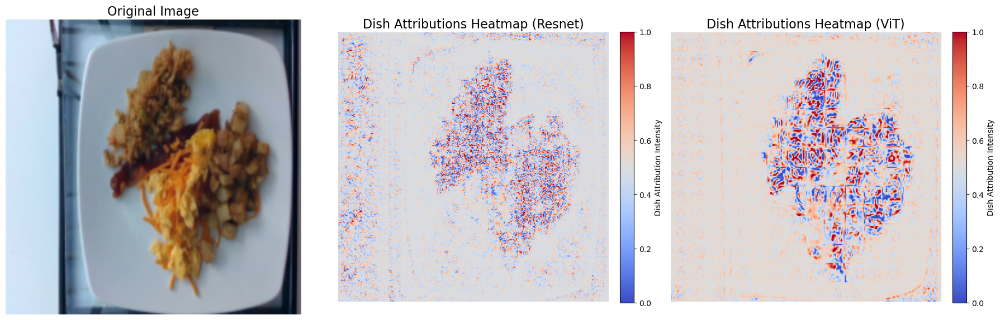

<Figure size 640x480 with 0 Axes>

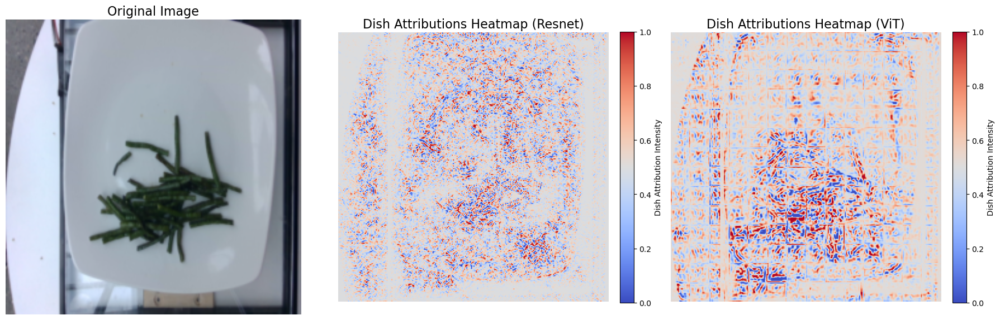

<Figure size 640x480 with 0 Axes>

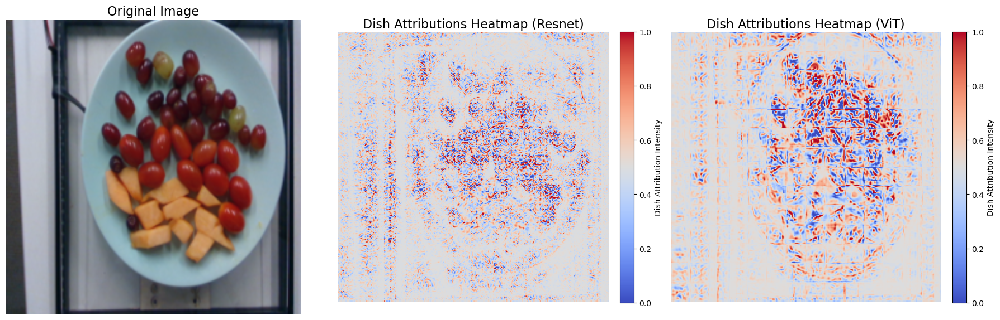

<Figure size 640x480 with 0 Axes>

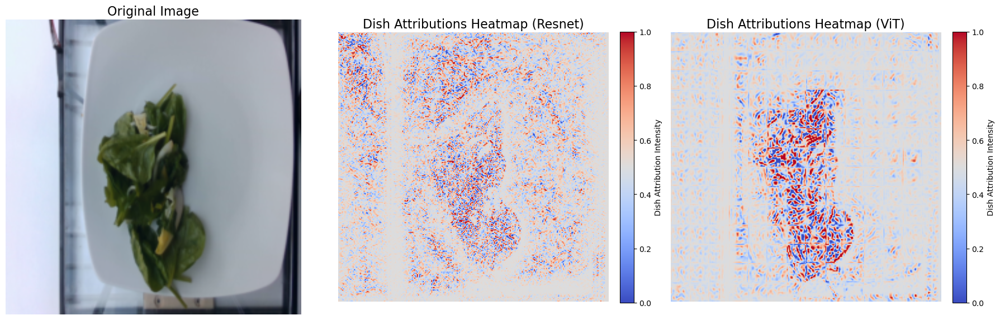

<Figure size 640x480 with 0 Axes>

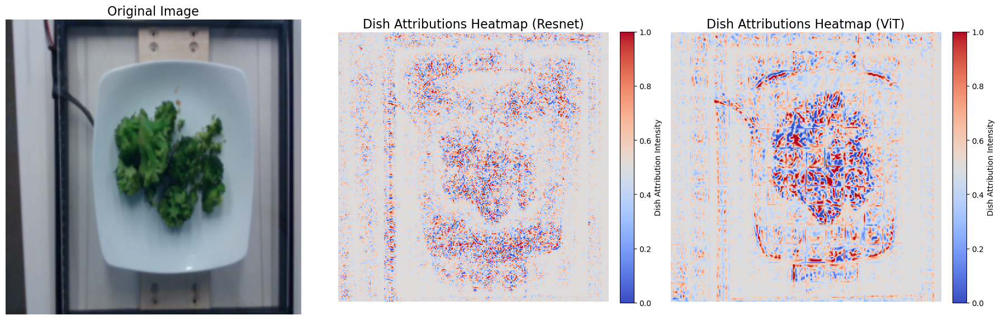

<Figure size 640x480 with 0 Axes>

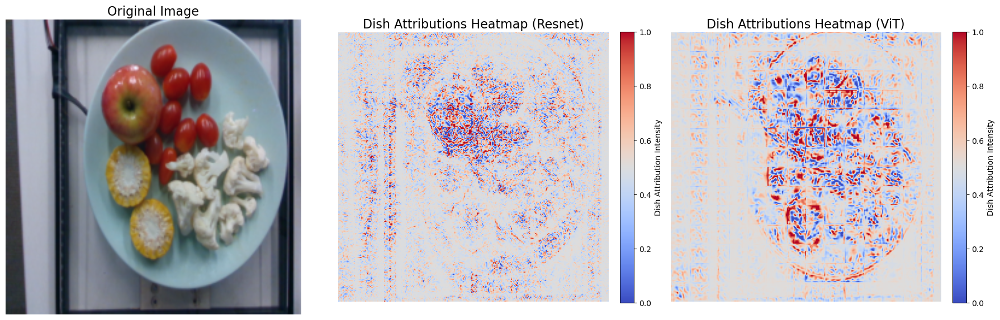

<Figure size 640x480 with 0 Axes>

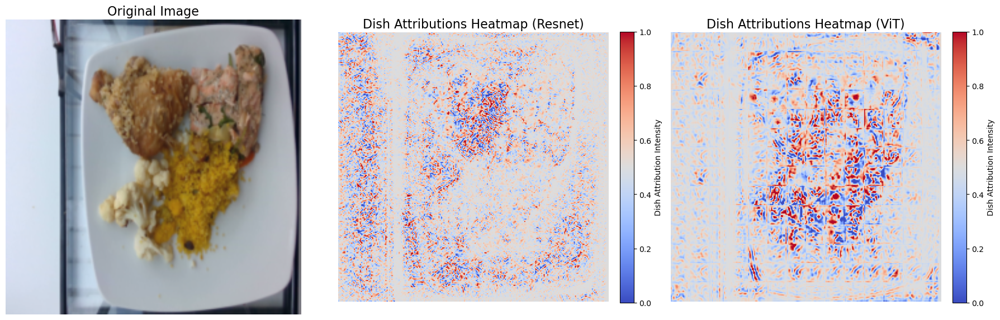

<Figure size 640x480 with 0 Axes>

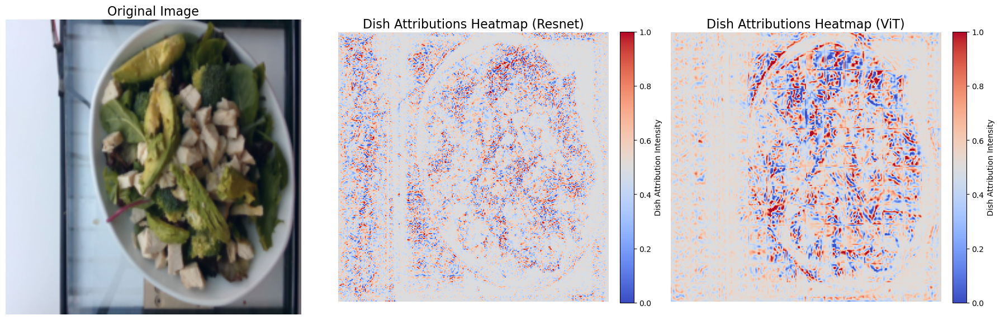

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_attr(image_input, i):
    # Normalize the original image
    original_image = image_input.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()  # Shape: (224, 224, 3)
    original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())  # Normalize to [0, 1]

    def process_attr(attr):
        aggregated_attr = attr.squeeze(0).sum(dim=0).cpu().detach().numpy()  # Shape: (224, 224)
        normalized_attr = (aggregated_attr - np.percentile(aggregated_attr, 2)) / (np.percentile(aggregated_attr, 98) - np.percentile(aggregated_attr, 2))
        normalized_attr = np.clip(normalized_attr, 0, 1)  # Clip to [0, 1]
        return normalized_attr

    # Normalize dish attributions
    resnet_dish_attributions, vit_dish_attributions = get_attr(image_input)
    
    resnet_dish_attributions = process_attr(resnet_dish_attributions)
    vit_dish_attributions = process_attr(vit_dish_attributions)

    # Create a single figure with 2 horizontally arranged subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Plot the original image (First subplot)
    axs[0].imshow(original_image, interpolation='bilinear', alpha=1.0)
    axs[0].axis("off")
    axs[0].set_title("Original Image", fontsize=16)

    # Plot the dish attributions heatmap (Second subplot)
    heatmap = axs[1].imshow(resnet_dish_attributions, cmap="coolwarm", alpha=1.0)
    fig.colorbar(heatmap, ax=axs[1], fraction=0.046, pad=0.04, label="Dish Attribution Intensity")
    axs[1].axis("off")
    axs[1].set_title("Dish Attributions Heatmap (Resnet)", fontsize=16)

    # Plot the dish attributions heatmap (Second subplot)
    heatmap = axs[2].imshow(vit_dish_attributions, cmap="coolwarm", alpha=1.0)
    fig.colorbar(heatmap, ax=axs[2], fraction=0.046, pad=0.04, label="Dish Attribution Intensity")
    axs[2].axis("off")
    axs[2].set_title("Dish Attributions Heatmap (ViT)", fontsize=16)

    # Adjust layout
    plt.tight_layout()
    
    # save image
    if not os.path.exists('./model_intrerpretability'):
        os.makedirs('./model_intrerpretability')
        
    fig.savefig(f'./model_intrerpretability/attr_{sampled_images[i]}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
for i, input_image in enumerate(input_images):
    visualize_attr(input_image, i)

5.248025818446521e-07 -7.420227329669394e-05


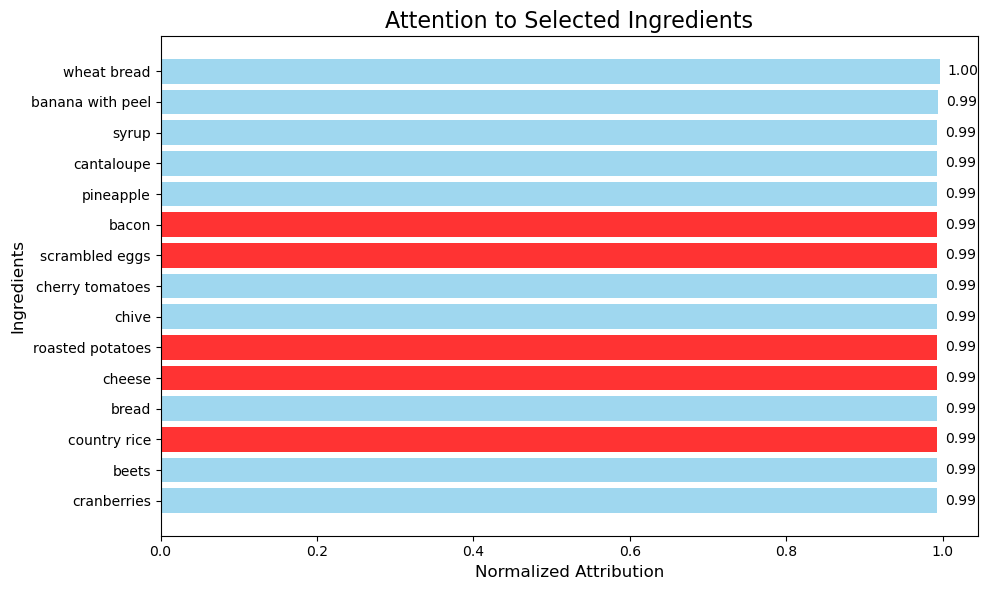

In [220]:
resnet_ingr_wrapped_model = IngrAttentionAttributionWrapper(resnet_model)

ingr_baseline = torch.zeros_like(embeddings)  # Baseline for Integrated Gradients

resnet_ingr_wrapped_model.image = input_images[0].unsqueeze(0).to(device)
ingr_ig = IntegratedGradients(resnet_ingr_wrapped_model)

ingr_attributions = ingr_ig.attribute(inputs=embeddings,
                                      baselines=ingr_baseline, 
                                      target=None)

import matplotlib.pyplot as plt
import numpy as np

# Normalize ingredient attributions
# Aggregate attributions for each ingredient (e.g., sum across dimensions)
aggregated_attributions = ingr_attributions.sum(dim=1).cpu().detach().numpy()  # Shape: [199]

print(aggregated_attributions.max(), aggregated_attributions.min())
# Normalize attributions to [0, 1]
normalized_attributions = (aggregated_attributions - aggregated_attributions.min()) / (aggregated_attributions.max() - aggregated_attributions.min())

ingredients_attn = ingr_index[0] #[1,2,3,74,..]
# randomly sample 10 ingredients from 199 ingredients other than ingredients_attn
index = [i for i in range(199) if i not in ingredients_attn]
random_ingredients = random.sample(index, 10)

# Select the ingredients to visualize
selected_ingredients_indices = ingredients_attn + random_ingredients
ingredient_labels = ["Y" if i in ingredients_attn else "N" for i in selected_ingredients_indices]
attn_ingredients = [all_ingredients[i] for i in selected_ingredients_indices]
attn_attributions = normalized_attributions[selected_ingredients_indices]

# Sort the selected ingredients by attribution in descending order
sorted_indices = np.argsort(attn_attributions)[::-1]
attn_ingredients_sorted = [attn_ingredients[i] for i in sorted_indices]
attn_attributions_sorted = attn_attributions[sorted_indices]
ingredient_labels_sorted = [ingredient_labels[i] for i in sorted_indices]

# Plot the attention to the selected ingredients
plt.figure(figsize=(10, 6))
bars = plt.barh(
    attn_ingredients_sorted,
    attn_attributions_sorted,
    color=["skyblue" if label == "N" else "red" for label in ingredient_labels_sorted],
    alpha=0.8,
)

# Add details to the chart
plt.xlabel("Normalized Attribution", fontsize=12)
plt.ylabel("Ingredients", fontsize=12)
plt.title("Attention to Selected Ingredients", fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to show the highest attribution at the top

# Add attribution values to the bars
for bar, value in zip(bars, attn_attributions_sorted):
    plt.text(
        bar.get_width() + 0.01,
        bar.get_y() + bar.get_height() / 2,
        f"{value:.2f}",
        va="center",
        fontsize=10,
    )

plt.tight_layout()
plt.show()